<a href="https://colab.research.google.com/github/DavidChaloyan/Pyhton/blob/main/SpoifyRecomSystem.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Music Recommendation System.**

  Interestingly, Spotify has a web API that developers can use to retrieve audio features and metadata about songs such as the song’s popularity, tempo, loudness, key, and the year in which it was released. We can use this data to build music recommendation systems that recommend songs to users based on both the audio features and the metadata of the songs that they have listened to.

  In order to build a music recommendation system, We used the Spotify Dataset, which is publicly available on Kaggle and contains metadata and audio features for over 170,000 different songs. We used three data files from this dataset. The first one contains data for individual songs while the next two files contain the data grouped the genres and years in which the songs were released.

# **Libraries**
We imported basic libraries for data manipulation and visualization.

In [ ]:
#Spotipy is a lightweight Python library for the Spotify Web API. With Spotipy you get full access to all of the music data provided by the Spotify platform.

!pip install spotipy #Install Spotify API. 


     |████████████████████████████████| 63 kB 727 kB/s 
     |████████████████████████████████| 138 kB 10.1 MB/s 
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [ ]:
import os
import numpy as np
import pandas as pd   

import seaborn as sns
import plotly.express as px 
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

# **Data Reading**

**Get three DataSets from Google Drive**

In [ ]:
url = 'https://drive.google.com/file/d/17E3U2QM39ssSuTQWOSOzloEwKb-YXTOh/view?usp=sharing'      # Import DataSet from Google Drive
path = 'https://drive.google.com/uc?export=download&id=' + url.split('/')[-2]
data = pd.read_csv(path)

url = 'https://drive.google.com/file/d/13oHG4WW316Z0y91TkDLn_EawMKMWsQYM/view?usp=sharing'      # Import DataSet from Google Drive
path = 'https://drive.google.com/uc?export=download&id=' + url.split('/')[-2]
genre_data = pd.read_csv(path)

url = 'https://drive.google.com/file/d/1ZOtzXVoiAzklFaaOO80TxhM06TOGfshj/view?usp=sharing'      # Import DataSet from Google Drive
path = 'https://drive.google.com/uc?export=download&id=' + url.split('/')[-2]
year_data = pd.read_csv(path)

**Before starting checking all columns for Non values. If we have Non values we can replace or  drop this values.**

In [ ]:
print(data.info())        #Non values Checking

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [ ]:
print(genre_data.info())    #Non values Checking

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [ ]:
print(year_data.info())   #Non values Checking

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


**As we can see, we don't have Non values in our three datasets. And that's good for us.**

# **Data Understanding And Visualization**

  **Music over time.**
  
Using the data grouped by year, we can understand how the overall sound of music has changed from 1921 to 2020.

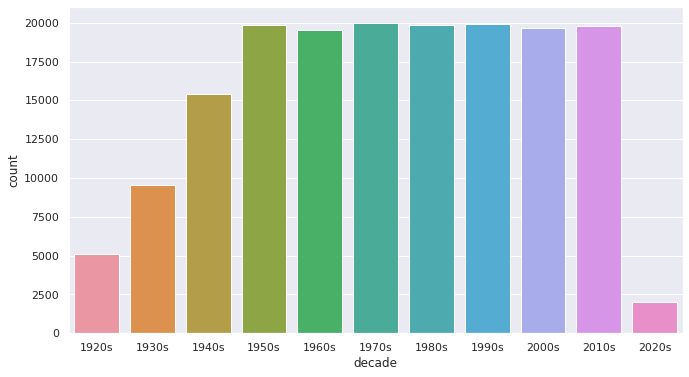

In [ ]:
def get_decade(year):               #Function for visualizing genres for decades
    period_start = int(year/10) * 10        
    decade = '{}s'.format(period_start)
    return decade

data['decade'] = data['year'].apply(get_decade)

sns.set(rc={'figure.figsize':(11 ,6)})
sns.countplot(data['decade'])


In [ ]:
sound_features = ['acousticness', 'danceability', 'energy', 
                                      'instrumentalness', 'liveness', 'valence']
fig = px.line(year_data, x='year', y=sound_features)
fig.show()

**Based on the plot above, we can see that music has transitioned from the more acoustic and instrumental sound of the early 1900s to the more danceable and energetic sound of the 2000s. The music of the 2000s sounds very different due to the advent of computers and advanced audio engineering technology that allows us to create electronic music with a wide range of effects and beats.**

 **Characteristics of Different Genres.**

  This dataset contains the audio features for different songs along with the audio features for different genres. We can use this information to compare different genres and understand their unique differences in sound. In the code below,  selected the ten most popular genres from the dataset and visualized audio features for each of them.

In [ ]:
top10_genres = genre_data.nlargest(10, 'popularity') #Plotting histograms of the 10 most popular genres and their sounds

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability',
                                                      'acousticness'], barmode='group')
fig.show()

**Many of the genres above, such as Chinese electropop are extremely specific and likely belong to one or more broad genres such as pop or electronic music. We can take these highly specific genres and understand how similar they are to other genres by clustering them based on their audio features.**

# **Clustering Genres with K-Means**

**In the code below, We used the famous and simple K-means clustering algorithm to divide the over 2,900 genres in this dataset into ten clusters based on the numerical audio features of each genre.**

In [ ]:
from sklearn.cluster import KMeans                #Import K-means for Clustering
from sklearn.preprocessing import StandardScaler  #StandardScaller for Normalization
from sklearn.pipeline import Pipeline             

cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                            ('kmeans', KMeans(n_clusters=10))])
X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)

**Visualizing the Genres Clusters with t-SNE.**

There are many audio features for each genre and it is difficult to visualize clusters in a high-dimensional space. However, we can use a dimensionality reduction technique known as t-Distributed Stochastic Neighbor Embedding to compress the data into a two-dimensional space as demonstrated in the code below.

In [ ]:
from sklearn.manifold import TSNE  

tsne_pipeline = Pipeline([('scaler', StandardScaler()),
                                      ('tsne', TSNE(n_components=2, verbose=1))])

genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.006s...
[t-SNE] Computed neighbors for 2973 samples in 0.321s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.107811
[t-SNE] KL divergence after 1000 iterations: 1.389236


# **Clustering Songs with K-Means**

**We can also cluster the songs using K-means as demonstrated below in order to understand how to build a better recommendation system.**

In [ ]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()), 
                                  ('kmeans', KMeans(n_clusters=20, 
                                   verbose=False))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

**Visualizing the Song Clusters with PCA.**

The song data frame is much larger than the genre data frame so we decided to use PCA for dimensionality reduction rather than t-SNE because it runs significantly faster.

In [ ]:
from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter( 
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()


# **Finding songs that are not in the dataset.**

Before we build this recommendation system, we need to be able to accommodate songs that don’t exist in the original Spotify Songs Dataset. The `find_song` function that we defined below fetches the data for any song from Spotify’s catalog given the song’s name and release year. The results are returned as a Pandas Dataframe with the data fields present in the original dataset that we downloaded from Kaggle.

In [ ]:
!pip install urllib3 --upgrade      
!pip install requests --upgrade 
!pip install spotipy --upgrade
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict

sp = spotipy.Spotify(
                      auth_manager=SpotifyClientCredentials(
                          client_id="6560c4d8e2834ea6b608ca51171b670f",
                                 client_secret="7f78cdf742a644869333bb6254fc344c")
                    )


def find_song(name, year):        #Function gets information about any song from Spotify by API
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]        
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data) #Return DataFrame in original fields

# **Generating song recommendations.**

Now we can finally build the music recommendation system! The recommendation algorithm we used is pretty simple and follows three steps:


1.   Compute the average vector of the audio and metadata features for each song the user has listened to.
2.   Find the n-closest data points in the dataset (excluding the points from the songs in the user’s listening history) to this average vector.
1.  Take these n points and recommend the songs corresponding to them






For the purpose of this project, used the cosine distance, which is defined below for two vectors u and v.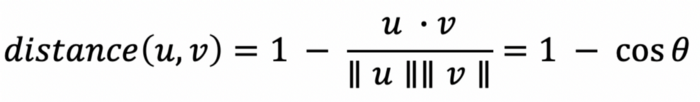

In [ ]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 
                  'danceability', 'duration_ms', 'energy', 
                      'explicit','instrumentalness', 'key', 'liveness', 
                         'loudness', 'mode', 'popularity', 'speechiness',  
                                                                        'tempo']


def get_song_data(song, spotify_data):
    
    try:
        song_data = spotify_data[(spotify_data['name'] == song['name']) 
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data
    
    except IndexError:
        return find_song(song['name'], song['year'])
        

def get_mean_vector(song_list, spotify_data):
    """
    Gets the song data for a specific song. The song argument takes the form of 
    a dictionary with key-value pairs for the name and release year of the song.
    """

    song_vectors = []
    
    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'
                                                          .format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)  
    
    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):  #Function for flattening a list of dictionaries
    
    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []
    
    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)
            
    return flattened_dict


def recommend_songs( song_list, spotify_data, n_songs=10):

    """
    Recommends Songs based on a list of previous songs.
    """
    
    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)
    
    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])
    
    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [ ]:
song_name = input('Input the song Name\t')
song_year = int(input('Input the song Year\t'))
x = recommend_songs([{'name': song_name, 'year':song_year}],  data)
print()
for i in x:
  for key, value in i.items():
    if key == 'artists':
      print(key, value[2:-2])
    else:
      print(key, value)
  print()

Input the song Name	Shape of my heart
Input the song Year	2017

name Dontchange - Album Version (Edited)
year 2002
artists Musiq Soulchild

name Don't You Forget It
year 2002
artists Glenn Lewis

name Valentine Love (Slow Version)
year 2003
artists Michael Henderson

name Love of My Own
year 1999
artists Eric Benét', 'Kevin "K.D." Davis

name Turn Blue
year 2014
artists The Black Keys

name Never
year 1997
artists Boyz II Men

name H.A.T.E.U.
year 2009
artists Mariah Carey

name How I Feel
year 2005
artists Wax Tailor

name Home
year 2012
artists Daughter

name Dontchange - Album Version (Edited)
year 2002
artists Musiq Soulchild

